# Lab 01: Thực hành phân tích và xử lý ảnh

## Bài 1

#### Nhập thư viện

In [1]:
# Import thư viện
import numpy as np 
import pandas as pd
import cv2 #OpenCV
from matplotlib import pyplot as plt 
from pylab import imread
from skimage.color import rgb2gray

C:\Users\PC\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


In [2]:
# Xử lý đường dẫn
import os
os.chdir('D:/dai hoc/năm 3/HK1/DIP/lab01/image')

#### Hàm show ảnh

In [3]:
def imshows(ImageData, LabelData, rows, cols, gridType = False):
  # Convert ImageData and LabelData to List
  from matplotlib import pyplot as plt
  ImageArray = list(ImageData)
  LabelArray = list(LabelData)
  if(rows == 1 & cols == 1):
    fig = plt.figure(figsize=(20,20))
  else:
    fig = plt.figure(figsize=(cols*8,rows*5))
        
  for i in range(1, cols * rows + 1):
      fig.add_subplot(rows, cols, i)
      image = ImageArray[i - 1]
      # Nếu số kênh màu nhỏ hơn 3 thì ta trình chiếu ảnh đen trắng
      # ngược lại thì trình chiếu ảnh màu
      if (len(image.shape) < 3):
          plt.imshow(image, plt.cm.gray)
          plt.grid(gridType)
      else:
          plt.imshow(image)
          plt.grid(gridType)
      plt.title(LabelArray[i - 1])
  plt.show()

def ShowThreeImages(IM1, IM2, IM3):
    imshows([IM1, IM2, IM3], ["Ảnh 1","Ảnh 2", "Ảnh 3"], 1, 3)
def ShowTwoImages(IM1, IM2):
    imshows([IM1, IM2], ["Ảnh 1","Ảnh 2"], 1, 2)
def ShowOneImage(IM):
    imshows([IM], ["Ảnh"], 1, 1)
def ShowListImages(listImage, row, col):
    listCaption = []
    for i in range(len(listImage)):
        listCaption.append(str(i))
    imshows(listImage,listCaption,row,col)

#### 1.1. Đọc ảnh và tạo ảnh gray_scale

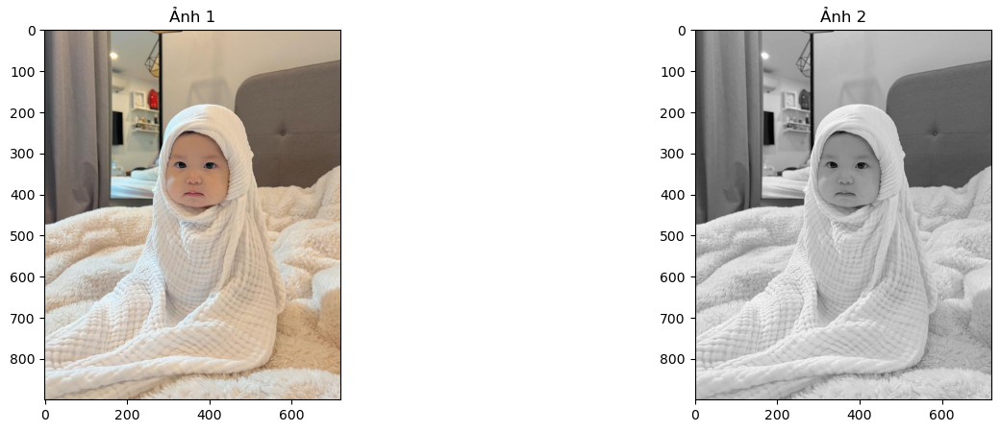

In [4]:
# Read Image 
image_color = imread("pam.jpg")
# Convert Image into Gray: Chuyển thành ảnh xám
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)

# Display Image: Hiển thị ảnh
ShowTwoImages(image_color, image_gray)

#### 1.2. Tạo ảnh hsv và hiển thị các kênh hue, saturation và value

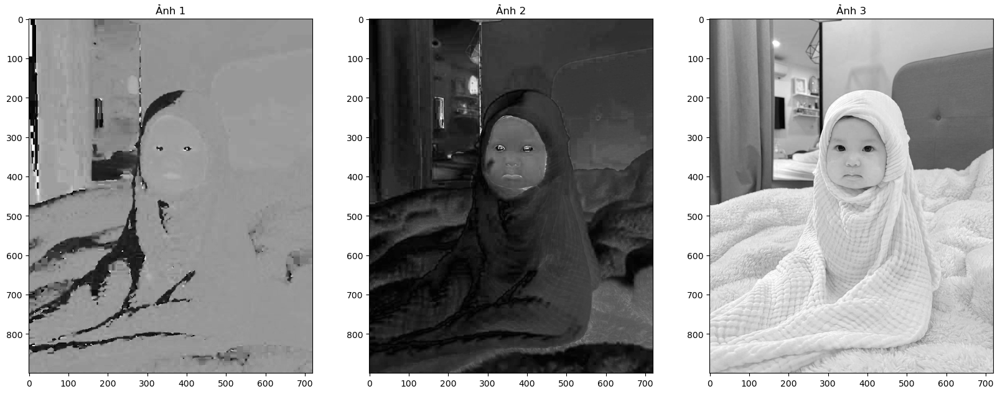

In [5]:
# Convert Image into HSV color spaces
image_hsv = cv2.cvtColor(image_color, cv2.COLOR_BGR2HSV)

# Show each channel H , S and V
ShowThreeImages(image_hsv[:,:,0],image_hsv[:,:,1],image_hsv[:,:,2])

#### 1.3. Chọn ngưỡng hue để trích xuất đối tượng chủ đạo trong ảnh (hiển thị ảnh màu đối tượng sau khi trích xuất)

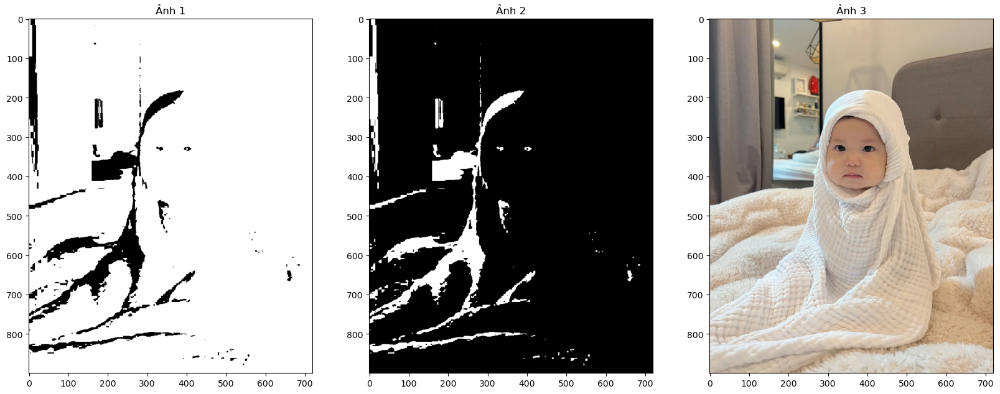

In [6]:
hue_img = image_hsv[:,:,0]
hue_threshold = 50

# Use threshold to segment object by histogram: Sử dụng ngưỡng để phân loại đối tượng theo histogram
hue_binary01 = hue_img > hue_threshold
hue_binary02 = 1 - hue_binary01

ShowThreeImages(hue_binary01, hue_binary02, image_color)

#### 1.4. Hiển thị histogram của 3 kênh màu r,g,b 

<function matplotlib.pyplot.show(close=None, block=None)>

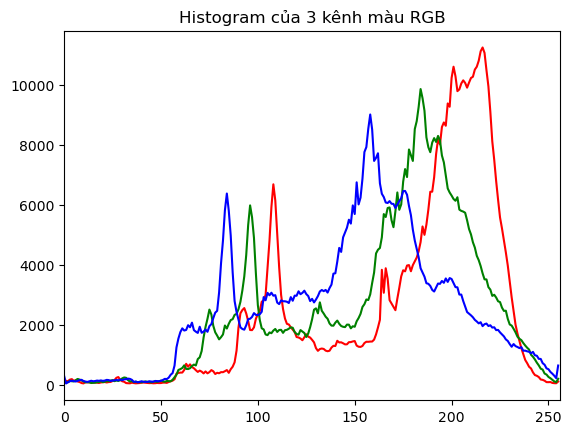

In [7]:
#RGB
color = ('r','g','b')
for channel,col in enumerate(color):
  histr = cv2.calcHist([image_color], [channel],None,[256],[0,256])
  plt.plot(histr,color=col) #vẽ đường theo màu
  plt.xlim([0,256]) #biên của x là từ 0 -> 256
plt.title("Histogram của 3 kênh màu RGB")
plt.show

#### 1.5. Hiển thị histogram của 3 kênh màu h,s,v

<function matplotlib.pyplot.show(close=None, block=None)>

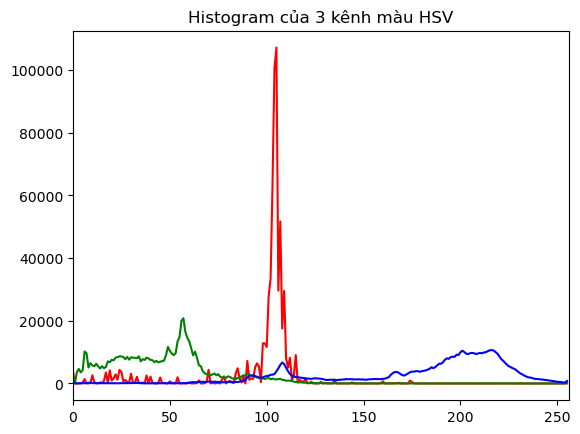

In [8]:
#HSV
color = ('r','g','b')
for channel,col in enumerate(color):
  hist = cv2.calcHist([image_hsv], [channel],None,[256],[0,256])
  plt.plot(hist,color=col) #vẽ đường theo màu
  plt.xlim([0,256]) #biên của x là từ 0 -> 256
plt.title("Histogram của 3 kênh màu HSV")
plt.show

#### 1.6. Tách vật và cảnh

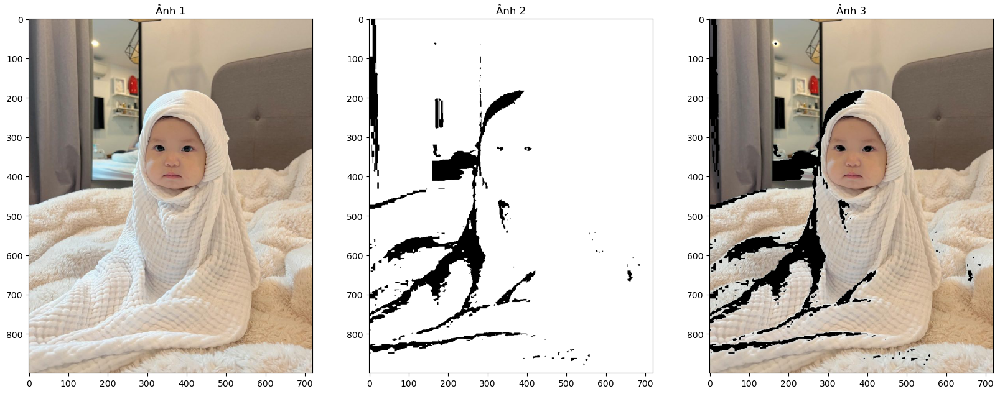

In [9]:
def SegmentColorImageByMask(IM, Mask):    
    Mask = Mask.astype(np.uint8)
    result = cv2.bitwise_and(IM, IM, mask = Mask)
    return result
hue_binary01_rgb = SegmentColorImageByMask(image_color, hue_binary01)
ShowThreeImages(image_color, hue_binary01, hue_binary01_rgb)


## Bài 2

#### 2.1. Đọc ảnh và tạo ảnh xám từ ảnh màu

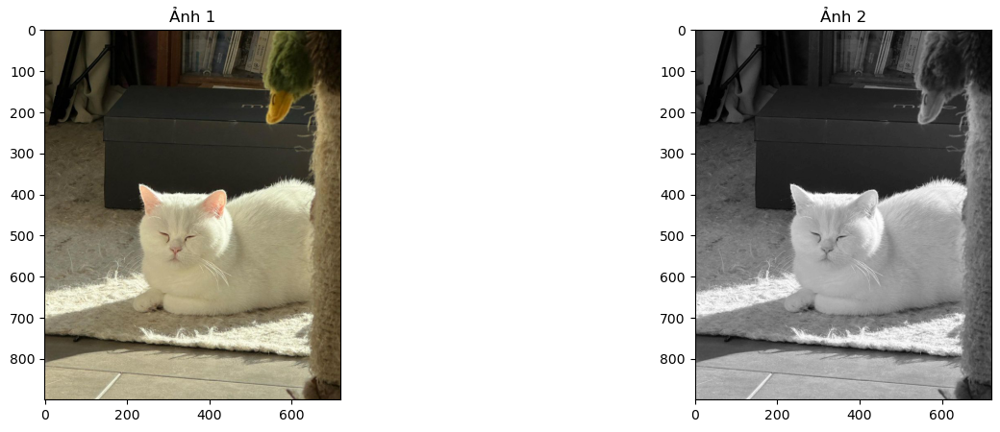

In [10]:
# Read Image 
image_color = imread("eggie.jpg")
# Convert Image into Gray: Chuyển thành ảnh xám
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)
# Display Image
ShowTwoImages(image_color, image_gray)

#### 2.2. Làm nhiễu ảnh

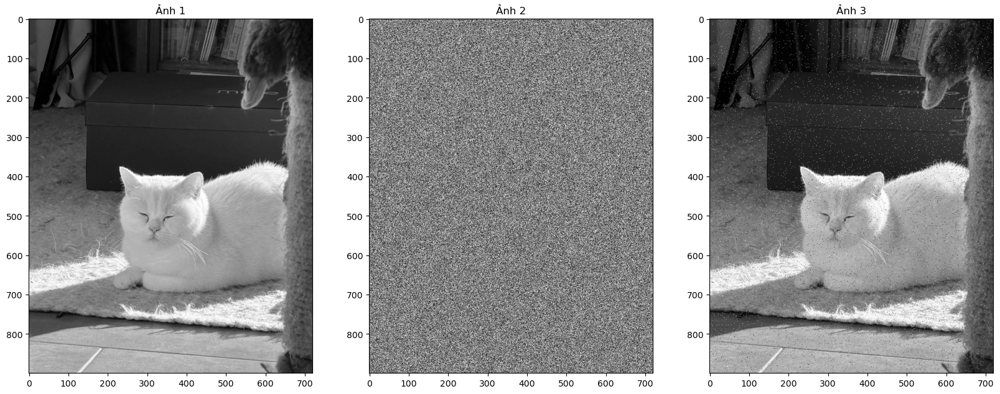

In [11]:
# Create Noise Image
noise = np.random.random(image_gray.shape)
image_noise = image_gray.copy() 
image_noise[noise > 0.99] = 255
image_noise[noise < 0.01] = 0

ShowThreeImages(image_gray, noise, image_noise)

#### 2.3. Làm mờ ảnh 

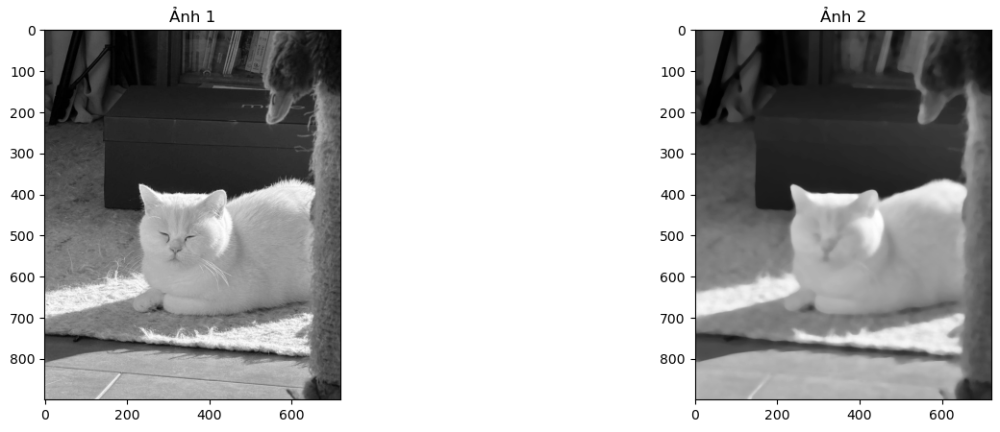

In [12]:
# Create Blurred Image
from skimage.filters.rank import median
from skimage.morphology import disk

image_blurred = median(image_gray, disk(8))
ShowTwoImages(image_gray, image_blurred)

#### 2.4.Hiển thị histogram của ảnh xám và cân bằng histogram, hiển thị ảnh sau khi cân bằng


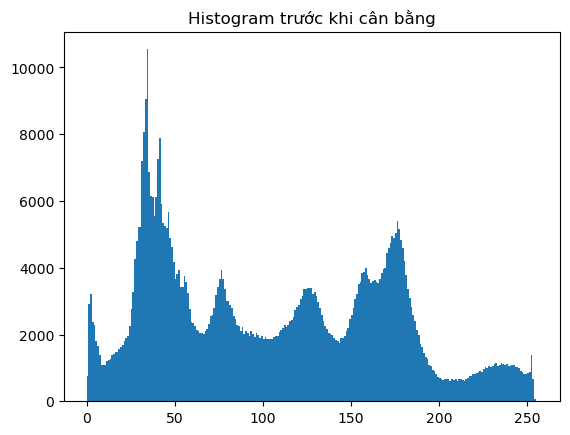

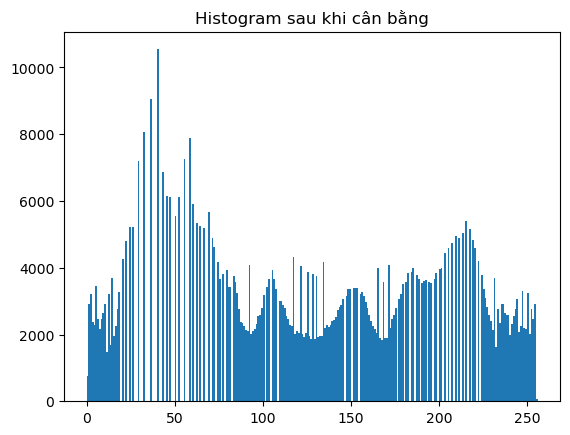

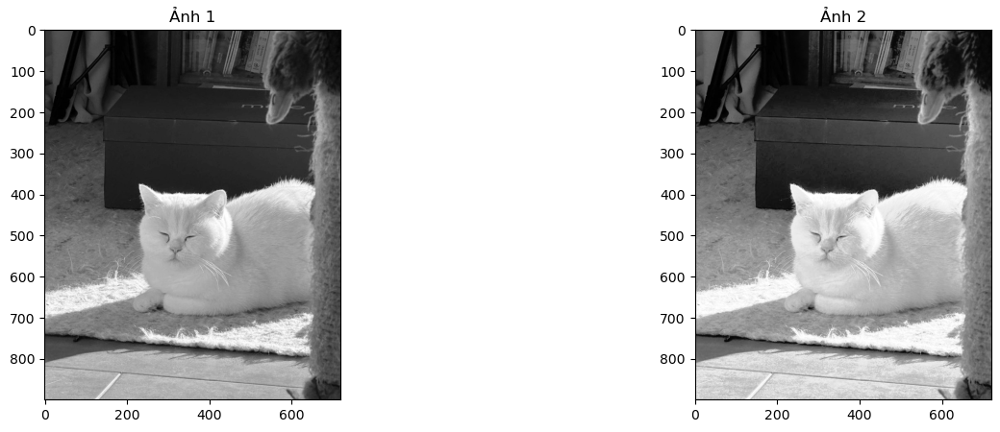

In [13]:
from skimage import data, exposure
image_equalization = exposure.equalize_hist(image_gray)
image_equalization = np.float32(image_equalization * 255)

#Histogram ảnh xám
hist = cv2.calcHist([image_gray],[0],None,[256],[0,256])
plt.hist(image_gray.ravel(),256,[0,256])
plt.title('Histogram trước khi cân bằng')
plt.show()

#Histogram sau khi cân bằng
hist = cv2.calcHist([image_equalization],[0],None,[256],[0,256])
plt.hist(image_equalization.ravel(),256,[0,256])
plt.title('Histogram sau khi cân bằng')
plt.show()

#Hiển thị ảnh sau khi cân bằng
ShowTwoImages(image_gray, image_equalization)

#### 2.5. Cân bằng 3 kênh màu hsv cùng lúc và hiển thị ảnh kết quả sau khi cân bằng 

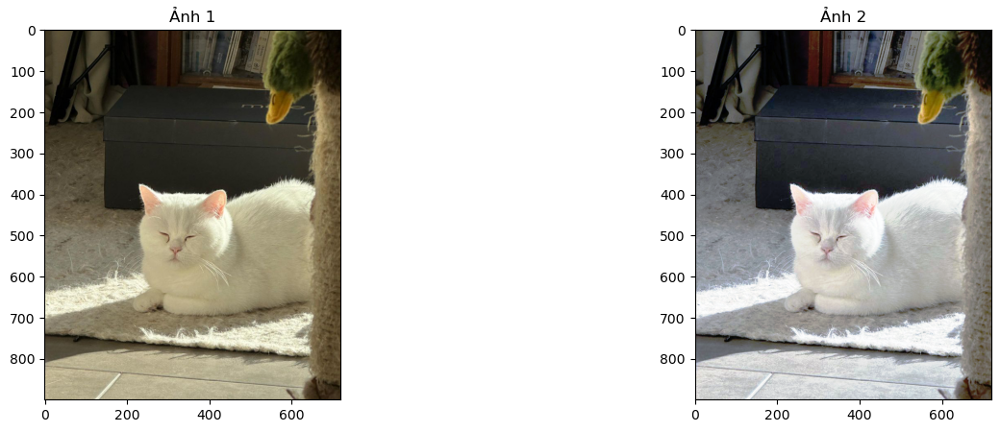

In [14]:
def histogram_equalize(img):
    r, g, b = cv2.split(img)
    red = cv2.equalizeHist(r)
    green = cv2.equalizeHist(g)
    blue = cv2.equalizeHist(b)
    return cv2.merge((red, green, blue))
# hiển thị ảnh kết quả sau khi cân bằng 
image_equalization_color = histogram_equalize(image_color)
ShowTwoImages(image_color, image_equalization_color)

#### 2.6. Enhance ảnh bằng cách cân bằng histogram kênh s và v

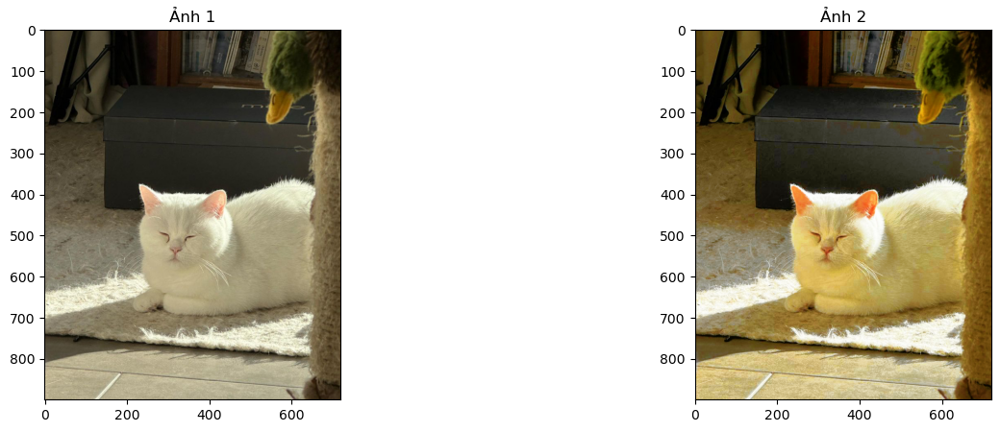

In [15]:
# Convert Image into HSV color spaces
image_hsv = cv2.cvtColor(image_color, cv2.COLOR_RGB2HSV)
# Apply histogram equalization
channel = 1 #Kênh s
image_hsv[:, :, channel] = cv2.equalizeHist(image_hsv[:, :, channel])
channel = 2 #Kênh v
image_hsv[:, :, channel] = cv2.equalizeHist(image_hsv[:, :, channel])
# Convert to RGB
image_enhanced = cv2.cvtColor(image_hsv, cv2.COLOR_HSV2RGB)
ShowTwoImages(image_color, image_enhanced)

#### 2.7. Thực hiện các biến đổi gamma và hiển thị ảnh màu tương ứng

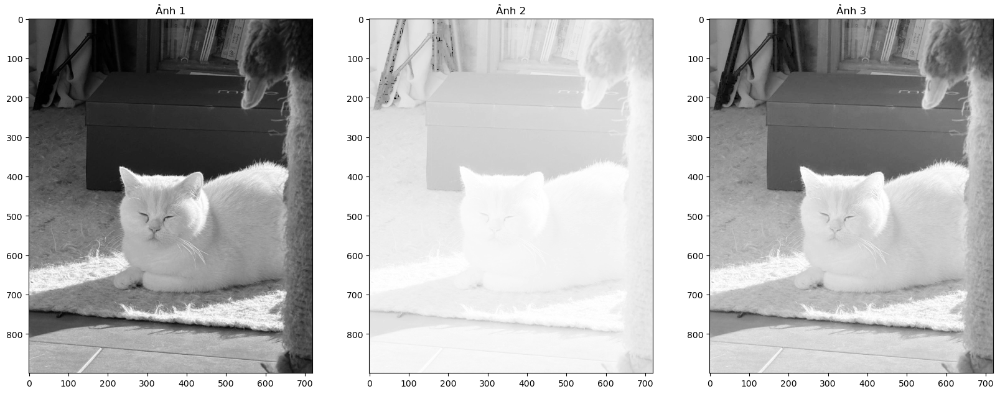

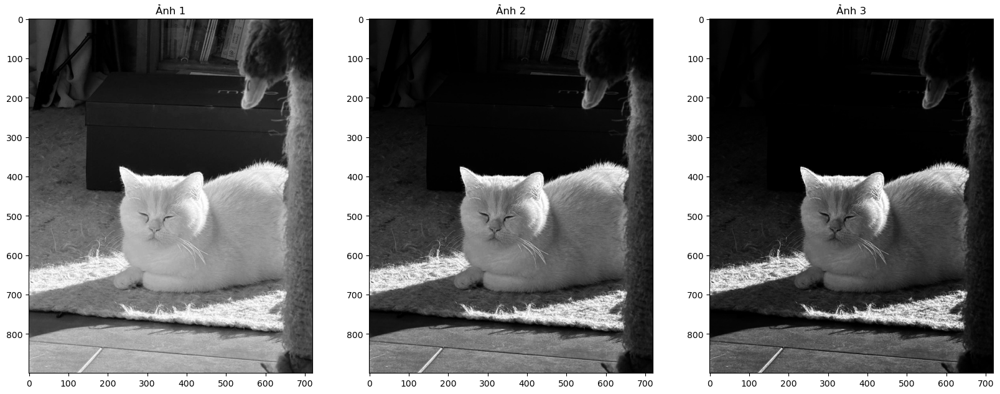

In [16]:
image_hsv = cv2.cvtColor(image_color, cv2.COLOR_RGB2HSV)
img = image_hsv[:,:,2]
gamma = [0.1, 0.5, 1.2, 2.2, 3.2] #gamma càng bé ảnh càng nhạt, ngược lại càng lớn ảnh càng đậm
gamma_corrected_01 = np.array(255*(img / 255) ** gamma[0], dtype = 'uint8') 
gamma_corrected_02 = np.array(255*(img / 255) ** gamma[1], dtype = 'uint8') 
gamma_corrected_03 = np.array(255*(img / 255) ** gamma[2], dtype = 'uint8') 
gamma_corrected_04 = np.array(255*(img / 255) ** gamma[3], dtype = 'uint8')
gamma_corrected_05 = np.array(255*(img / 255) ** gamma[4], dtype = 'uint8')
ShowThreeImages(image_gray, gamma_corrected_01, gamma_corrected_02)
ShowThreeImages(gamma_corrected_03, gamma_corrected_04, gamma_corrected_05)

#### 2.8. Chọn ngưỡng mức tối và ngưỡng mức sáng mà ở đó dưới mức tối sẽ cho tối hơn và trên mức sáng sẽ cho sáng hơn trên kênh màu value trong hsv.

In [17]:
channel = 2
image_hsv_01 = image_hsv.copy()
image_hsv_01[:,:,2] = gamma_corrected_01
image_enhanced_01 = cv2.cvtColor(image_hsv_01, cv2.COLOR_HSV2RGB)
image_hsv_02 = image_hsv.copy()
image_hsv_02[:,:,2] = gamma_corrected_02
image_enhanced_02 = cv2.cvtColor(image_hsv_02, cv2.COLOR_HSV2RGB)
image_hsv_03 = image_hsv.copy()
image_hsv_03[:,:,2] = gamma_corrected_03
image_enhanced_03 = cv2.cvtColor(image_hsv_03, cv2.COLOR_HSV2RGB)
image_hsv_04 = image_hsv.copy()
image_hsv_04[:,:,2] = gamma_corrected_04
image_enhanced_04 = cv2.cvtColor(image_hsv_04, cv2.COLOR_HSV2RGB)
image_hsv_05 = image_hsv.copy()
image_hsv_05[:,:,2] = gamma_corrected_05
image_enhanced_05 = cv2.cvtColor(image_hsv_05, cv2.COLOR_HSV2RGB)

#####  hiển thị ảnh kết quả sau khi enhance 


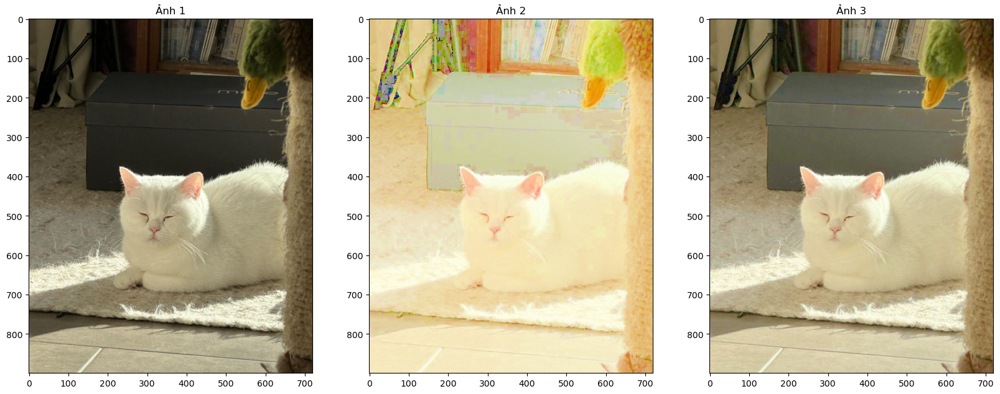

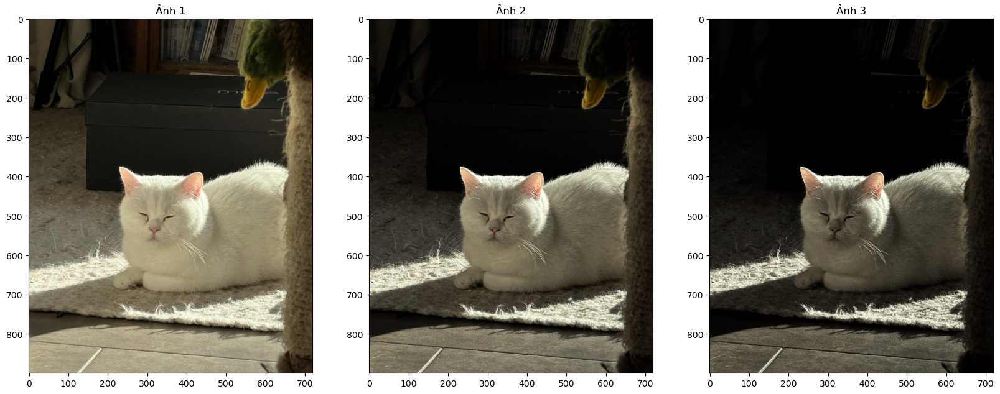

In [18]:
ShowThreeImages(image_color, image_enhanced_01, image_enhanced_02)
ShowThreeImages(image_enhanced_03, image_enhanced_04, image_enhanced_05)

#### 2.9. Xuất ảnh biên/cạnh của ảnh gốc

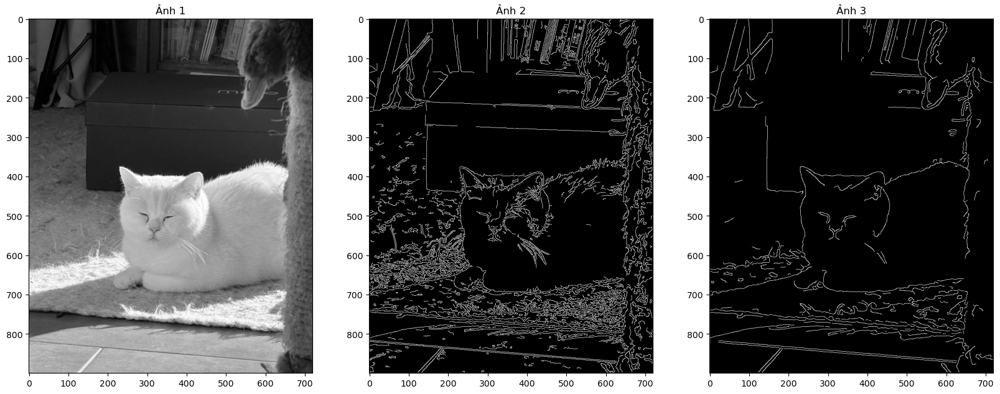

In [19]:
from skimage import feature
# sigma help to remove the noisy image in edge detection: sigma giúp loại bỏ hình ảnh nhiễu khi phát hiện cạnh
image_edges_01 = feature.canny(image_gray)
image_edges_02 = feature.canny(image_gray, sigma=2)
ShowThreeImages(image_gray, image_edges_01, image_edges_02)